In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import humanize
import plotly.express as px
import warnings

In [2]:
sns.set_style('darkgrid')
plt.rcParams['figure.dpi'] = 80
warnings.filterwarnings('ignore')

In [3]:
apartments = pd.read_csv('../../data/processed/apartments.csv', low_memory=False)
usaquen =  apartments[(apartments['tipo_operacion'] == 'VENTA') & (apartments['localidad'] == 'USAQUEN') & (apartments['coords_modified'] == False)]
usaquen = usaquen.drop(columns=['precio_arriendo'])
usaquen.head()

,codigo,tipo_propiedad,tipo_operacion,precio_venta,area,habitaciones,banos,administracion,parqueaderos,sector,...,permite_mascotas,gimnasio,ascensor,conjunto_cerrado,coords_modified,localidad,barrio,estacion_tm_cercana,distancia_estacion_tm_m,is_cerca_estacion_tm
1,2510-M4156145,APARTAMENTO,VENTA,4.850000e+08,84.0,3.0,3.0,680000.0,1.0,SANTA BARBARA,...,0.0,0.0,1.0,1.0,False,USAQUEN,SAN PATRICIO,Pepe Sierra,1116.77,0
4,10139-M3692828,APARTAMENTO,VENTA,1.570000e+09,213.0,3.0,4.0,994000.0,3.0,COUNTRY,...,0.0,1.0,1.0,1.0,False,USAQUEN,GINEBRA,Prado,2769.19,0
10,14733-M3655290,APARTAMENTO,VENTA,6.900000e+08,125.0,4.0,5.0,500000.0,2.0,COUNTRY,...,0.0,1.0,1.0,1.0,False,USAQUEN,URB. SANTACOLOMA,Alcalá,343.47,1
13,13436-M4332087,APARTAMENTO,VENTA,3.774000e+08,83.0,2.0,2.0,533000.0,1.0,CEDRITOS,...,0.0,1.0,1.0,1.0,False,USAQUEN,CEDRO SALAZAR,Calle 142,2117.69,0
14,13436-M4332032,APARTAMENTO,VENTA,3.500000e+08,92.0,3.0,2.0,370000.0,1.0,CEDRITOS,...,0.0,1.0,1.0,1.0,False,USAQUEN,VILLAS DEL MEDITERRANEO,Calle 161,1481.64,0


In [4]:
usaquen.datetime = pd.to_datetime(usaquen.datetime)
usaquen.fecha_actualizacion_precio_venta = pd.to_datetime(usaquen.fecha_actualizacion_precio_venta)

In [5]:
usaquen.shape

(18019, 39)

In [6]:
usaquen.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18019 entries, 1 to 72355
Data columns (total 39 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   codigo                               18019 non-null  object        
 1   tipo_propiedad                       18019 non-null  object        
 2   tipo_operacion                       18019 non-null  object        
 3   precio_venta                         18019 non-null  float64       
 4   area                                 18018 non-null  float64       
 5   habitaciones                         18017 non-null  float64       
 6   banos                                18017 non-null  float64       
 7   administracion                       16586 non-null  float64       
 8   parqueaderos                         18017 non-null  float64       
 9   sector                               17397 non-null  object        
 10  estrato        

In [7]:
usaquen.columns

Index(['codigo', 'tipo_propiedad', 'tipo_operacion', 'precio_venta', 'area',
       'habitaciones', 'banos', 'administracion', 'parqueaderos', 'sector',
       'estrato', 'antiguedad', 'estado', 'longitud', 'latitud', 'descripcion',
       'datetime', 'website', 'compañia', 'last_view',
       'fecha_actualizacion_precio_venta', 'precio_venta_anterior',
       'fecha_actualizacion_precio_arriendo', 'precio_arriendo_anterior',
       'direccion', 'jacuzzi', 'piso', 'closets', 'chimenea',
       'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado',
       'coords_modified', 'localidad', 'barrio', 'estacion_tm_cercana',
       'distancia_estacion_tm_m', 'is_cerca_estacion_tm'],
      dtype='object')

In [8]:
def format_tick_humanize(value, tick_number):
    return humanize.intword(value)

# Eliminar outliers

Eliminamos los precios que son outliers

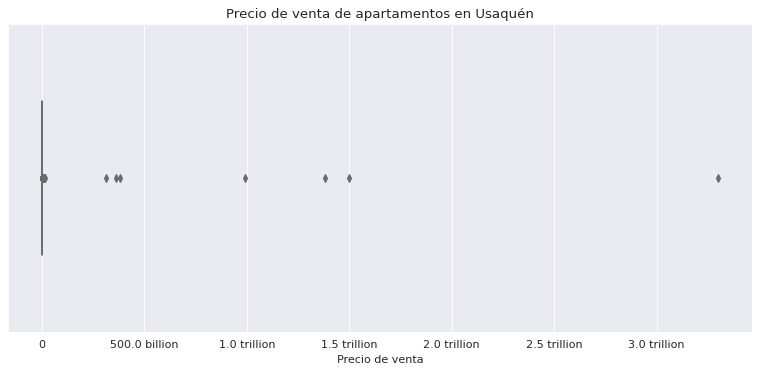

In [9]:
plt.figure(figsize=(12, 5))

sns.boxplot(
    usaquen,
    x='precio_venta',
    width=.5,
    palette='Set3',
)

plt.title('Precio de venta de apartamentos en Usaquén')
plt.xlabel('Precio de venta')
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

In [10]:
Q1 = usaquen['precio_venta'].quantile(0.25)
Q3 = usaquen['precio_venta'].quantile(0.75)

IQR = Q3 - Q1

lower = Q1 - (1.5 * IQR)
if lower < 0:
    lower = Q1 - (0.5 * IQR)
upper = Q3 + (1.5 * IQR)

outliers = usaquen[(usaquen['precio_venta'] < lower) | (usaquen['precio_venta'] > upper)]
outliers.shape

(1006, 39)

In [11]:
usaquen = usaquen[(usaquen['precio_venta'] > lower) & (usaquen['precio_venta'] < upper)]
usaquen.shape

(17013, 39)

# Analisis Univariado

## Area (m2)

### Eliminar outliers

In [12]:
# eliminar area igual a 0

usaquen = usaquen[usaquen['area'] > 0]

Eliminamos las areas (m2) que son outliers

In [13]:
Q1 = usaquen['area'].quantile(0.25)
Q3 = usaquen['area'].quantile(0.75)

IQR = Q3 - Q1

lower = Q1 - (1.5 * IQR)
upper = Q3 + (1.5 * IQR)

outliers = usaquen[(usaquen['area'] < lower) | (usaquen['area'] > upper)]
outliers.shape

(319, 39)

In [14]:
usaquen = usaquen[(usaquen['area'] > lower) & (usaquen['area'] < upper)]
usaquen.shape

(16656, 39)

### Analisis

In [15]:
usaquen.area.describe().apply(lambda x: humanize.intcomma(x)).to_frame().T

,count,mean,std,min,25%,50%,75%,max
area,"16,656.0",118.25956111911623,54.979362564594304,1.0,75.5,105.0,153.0,280.0


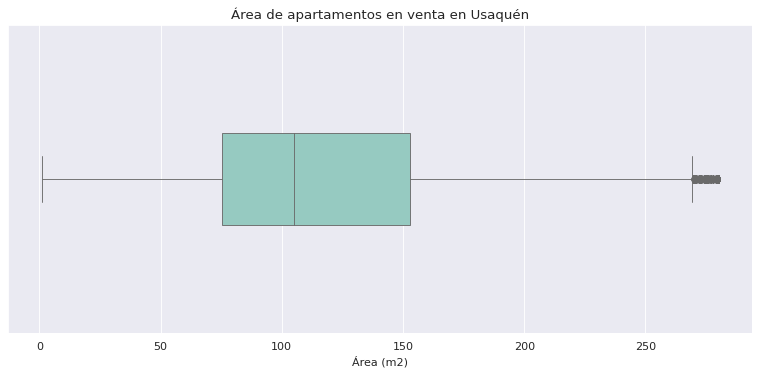

In [16]:
plt.figure(figsize=(12, 5))

sns.boxplot(
    data=usaquen,
    x='area',
    width=.3,
    palette='Set3',
    linewidth=.8,
)

plt.title('Área de apartamentos en venta en Usaquén')
plt.xlabel('Área (m2)')
plt.show()

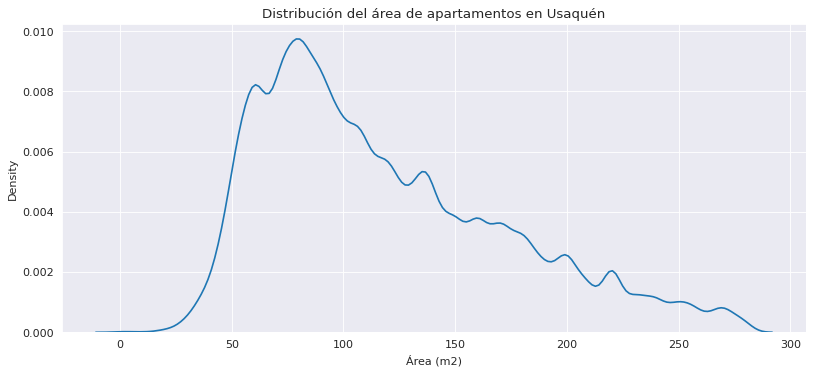

In [17]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='area',
    bw_adjust=.5,
)

plt.title('Distribución del área de apartamentos en Usaquén')
plt.xlabel('Área (m2)')
plt.show()

### Cercania a Transmilenio

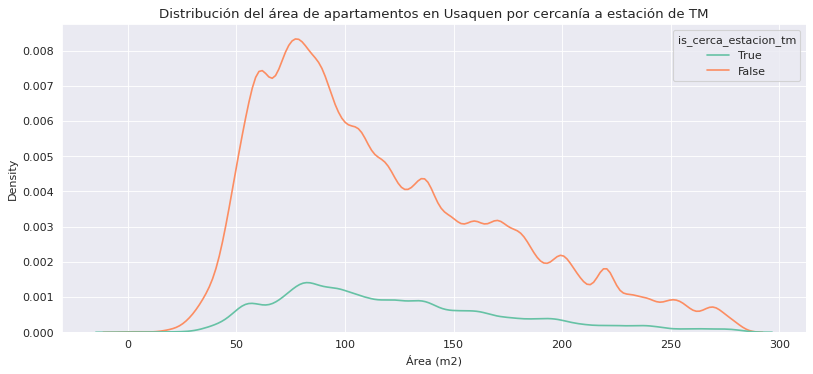

In [18]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='area',
    bw_adjust=.5,
    hue='is_cerca_estacion_tm',
    palette='Set2',
    hue_order=[True, False],
)

plt.title('Distribución del área de apartamentos en Usaquen por cercanía a estación de TM')
plt.xlabel('Área (m2)')
plt.show()

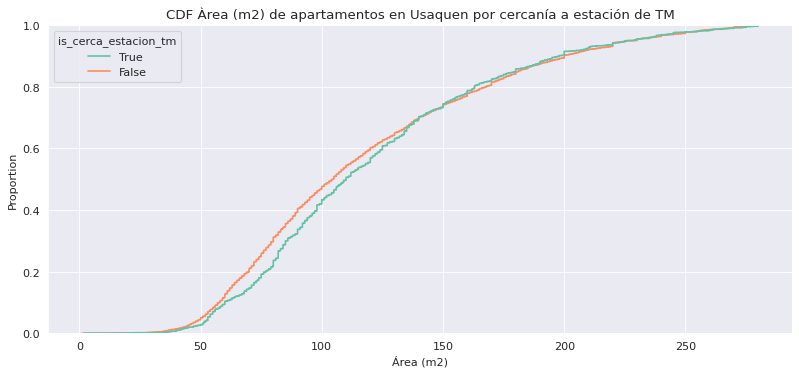

In [19]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='area',
    hue='is_cerca_estacion_tm',
    palette='Set2',
    hue_order=[True, False],
)

plt.title('CDF Àrea (m2) de apartamentos en Usaquen por cercanía a estación de TM')
plt.xlabel('Área (m2)')
plt.show()


### Estrato

In [20]:
usaquen.groupby('estrato')['area'].describe().applymap(lambda x: round(x, 1))

,count,mean,std,min,25%,50%,75%,max
estrato,,,,,,,,
0.0,8.0,137.9,52.9,67.0,111.2,124.5,160.8,245.0
1.0,3.0,111.3,53.4,62.0,83.0,104.0,136.0,168.0
2.0,37.0,59.0,37.1,38.0,46.0,50.0,56.2,256.0
3.0,650.0,61.8,23.6,27.0,50.0,60.0,69.0,240.0
4.0,4059.0,84.0,28.3,2.0,64.0,80.0,97.0,280.0
5.0,4338.0,114.0,47.1,17.0,80.0,106.0,139.7,280.0
6.0,7559.0,144.2,57.4,1.0,98.0,140.0,185.0,280.0


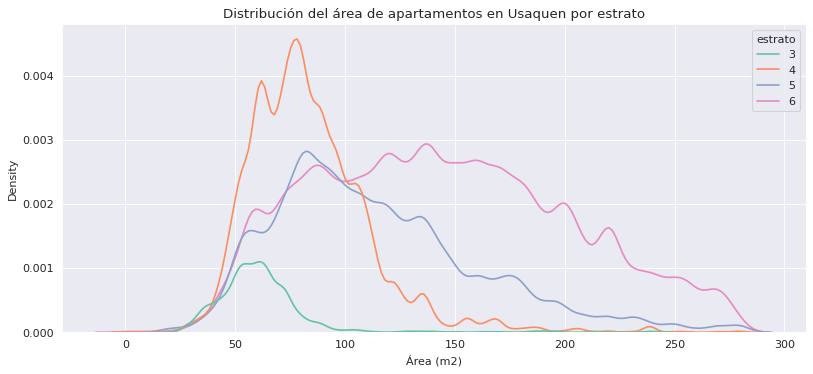

In [21]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='area',
    bw_adjust=.5,
    hue='estrato',
    hue_order=[3, 4, 5, 6],
    palette='Set2',
)

plt.title('Distribución del área de apartamentos en Usaquen por estrato')
plt.xlabel('Área (m2)')
plt.show()

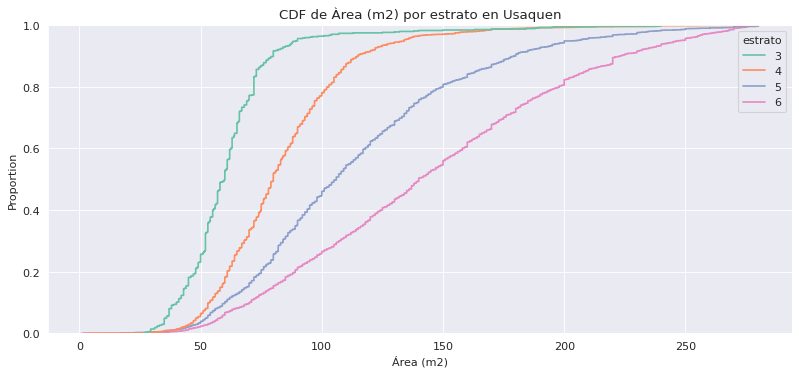

In [22]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='area',
    hue='estrato',
    palette='Set2',
    hue_order=[3, 4, 5, 6],
)

plt.title('CDF de Àrea (m2) por estrato en Usaquen')
plt.xlabel('Área (m2)')
plt.show()

### Antiguedad

In [23]:
usaquen.groupby('antiguedad')['area'].describe().applymap(lambda x: round(x, 1))

,count,mean,std,min,25%,50%,75%,max
antiguedad,,,,,,,,
ENTRE 0 Y 5 ANOS,2221.0,93.5,43.0,17.0,60.0,84.0,118.0,275.0
ENTRE 10 Y 20 ANOS,4610.0,121.3,55.0,2.0,78.0,109.0,156.0,280.0
ENTRE 5 Y 10 ANOS,2828.0,105.3,47.5,2.0,71.5,94.0,130.0,280.0
MAS DE 20 ANOS,6569.0,128.9,57.4,1.0,82.0,117.0,170.0,280.0
REMODELADO,418.0,135.1,60.3,29.4,83.2,129.6,179.8,280.0


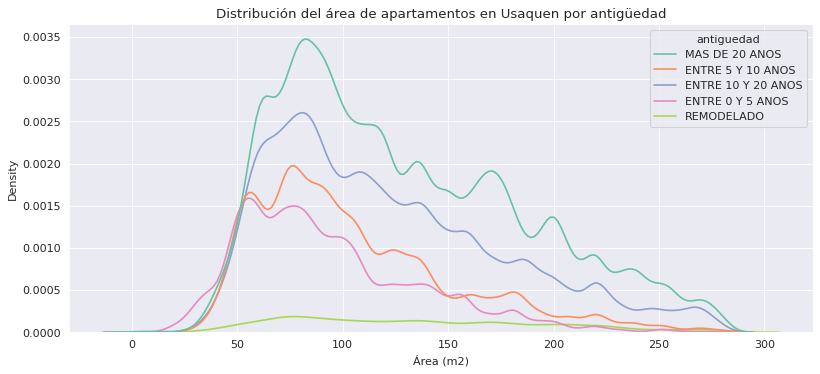

In [24]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='area',
    bw_adjust=.5,
    hue='antiguedad',
    palette='Set2',
)

plt.title('Distribución del área de apartamentos en Usaquen por antigüedad')
plt.xlabel('Área (m2)')
plt.show()

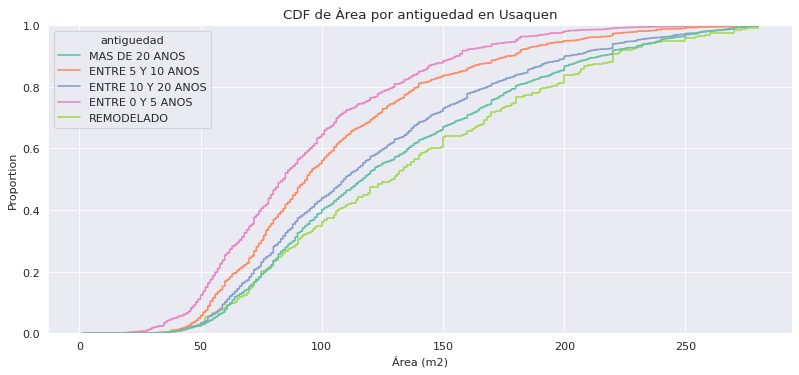

In [25]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='area',
    hue='antiguedad',
    palette='Set2',
)

plt.title('CDF de Àrea por antiguedad en Usaquen')
plt.xlabel('Área (m2)')
plt.show()

Lo apartamentos mas recientes tienden a tener un Àrea menor que los mas antiguos

### Estacion de TM Cercana

In [26]:
estacion_tm_cercana = usaquen[usaquen['is_cerca_estacion_tm'] == True]
estacion_tm_cercana_stats = estacion_tm_cercana.groupby('estacion_tm_cercana')['area'].describe().applymap(lambda x: round(x, 1)).sort_values(by='mean', ascending=False)
estacion_tm_cercana_stats

,count,mean,std,min,25%,50%,75%,max
estacion_tm_cercana,,,,,,,,
Calle 106,598.0,145.9,54.6,2.0,107.2,140.0,182.0,280.0
Calle 100,62.0,135.0,53.9,40.0,96.0,130.0,176.0,261.1
Pepe Sierra,408.0,134.1,54.8,37.0,92.0,123.0,166.0,280.0
Calle 127,385.0,125.4,47.8,36.3,95.0,117.0,155.0,276.6
Prado,227.0,122.5,46.6,23.0,86.0,118.0,146.0,280.0
Mazurén,28.0,102.0,17.5,60.0,95.5,112.0,112.0,130.0
Calle 146,74.0,97.8,35.5,40.0,74.2,92.0,107.2,209.0
Terminal,3.0,94.4,11.4,81.3,91.2,101.0,101.0,101.0
Calle 187,54.0,89.2,31.8,41.0,70.0,84.0,101.0,180.0


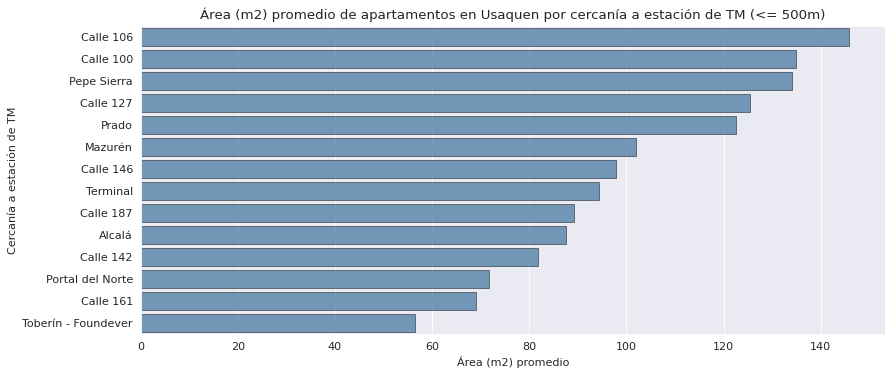

In [27]:
plt.figure(figsize=(12, 5))

sns.barplot(
    estacion_tm_cercana_stats,
    y=estacion_tm_cercana_stats.index,
    x='mean',
    # palette='Set2',
    color='steelblue',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Área (m2) promedio de apartamentos en Usaquen por cercanía a estación de TM (<= 500m)')
plt.xlabel('Área (m2) promedio')
plt.ylabel('Cercanía a estación de TM')
plt.show()

In [28]:
estacion_tm_cercana_stats = estacion_tm_cercana.groupby('estacion_tm_cercana')['area'].describe().applymap(lambda x: round(x, 1)).sort_values(by='50%', ascending=False)

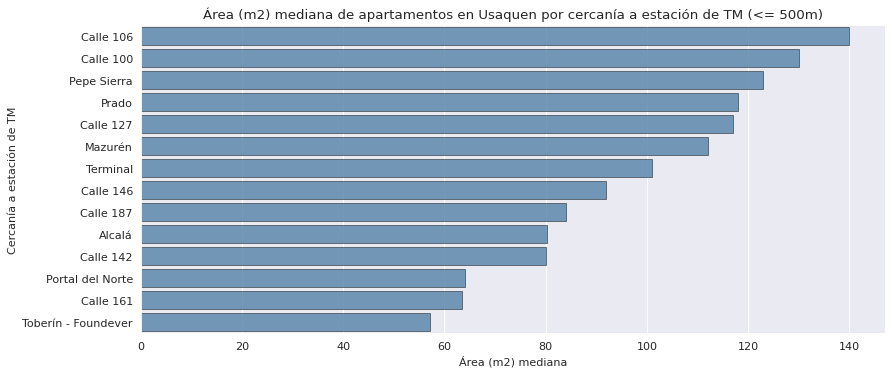

In [29]:
plt.figure(figsize=(12, 5))

sns.barplot(
    estacion_tm_cercana_stats,
    y=estacion_tm_cercana_stats.index,
    x='50%',
    # palette='Set2',
    color='steelblue',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Área (m2) mediana de apartamentos en Usaquen por cercanía a estación de TM (<= 500m)')
plt.xlabel('Área (m2) mediana')
plt.ylabel('Cercanía a estación de TM')
plt.show()

<Figure size 960x400 with 0 Axes>

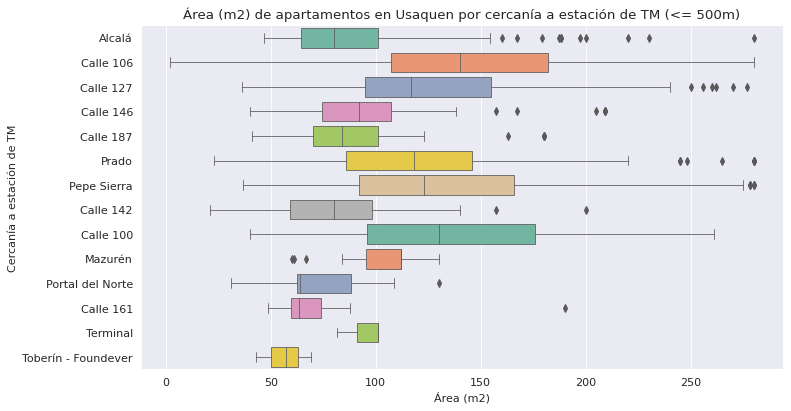

In [30]:
plt.figure(figsize=(12, 5))

sns.catplot(
    data=estacion_tm_cercana,
    x='area',
    y='estacion_tm_cercana',
    kind='box',
    height=5,
    aspect=2,
    palette='Set2',
    orient='h',
    linewidth=.7,
)

plt.title('Área (m2) de apartamentos en Usaquen por cercanía a estación de TM (<= 500m)')
plt.xlabel('Área (m2)')
plt.ylabel('Cercanía a estación de TM')
plt.show()

## Precio de venta

In [31]:
fig = px.scatter_mapbox(
    usaquen,
    lat='latitud',
    lon='longitud',
    color='precio_venta',
    size='area',
    color_continuous_scale=px.colors.cyclical.IceFire,
    size_max=15,
    zoom=11,
    mapbox_style='open-street-map',
    # mapbox_style='dark',
    title='Precio de venta y área de apartamentos en Usaquen',
    hover_name='barrio',
    hover_data=['area', 'precio_venta', 'estrato', 'antiguedad', 'is_cerca_estacion_tm', 'estacion_tm_cercana'],
)

fig.update_layout(
    margin=dict(l=0, r=0, t=50, b=0),
    coloraxis_colorbar=dict(
        title='Precio de venta',
        tickformat='s',
    ),
)

fig.show()

In [32]:
usaquen.precio_venta.describe().apply(lambda x: humanize.intword(x)).to_frame().T

,count,mean,std,min,25%,50%,75%,max
precio_venta,16.7 thousand,743.5 million,409.5 million,120.0 million,430.0 million,630.0 million,960.0 million,2.1 billion


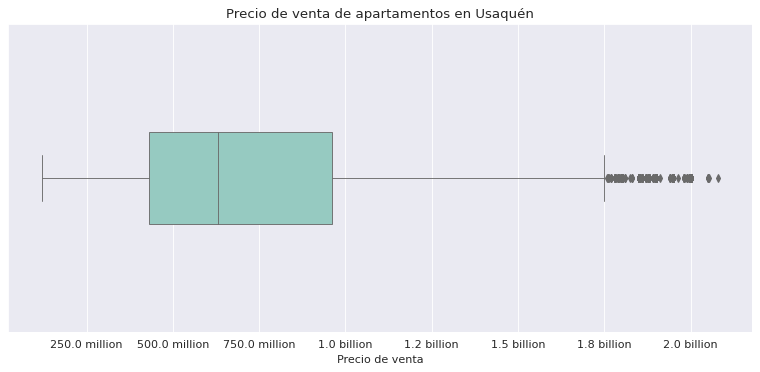

In [33]:
plt.figure(figsize=(12, 5))

sns.boxplot(
    usaquen,
    x='precio_venta',
    width=.3,
    palette='Set3',
    linewidth=.8,
)

plt.title('Precio de venta de apartamentos en Usaquén')
plt.xlabel('Precio de venta')
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

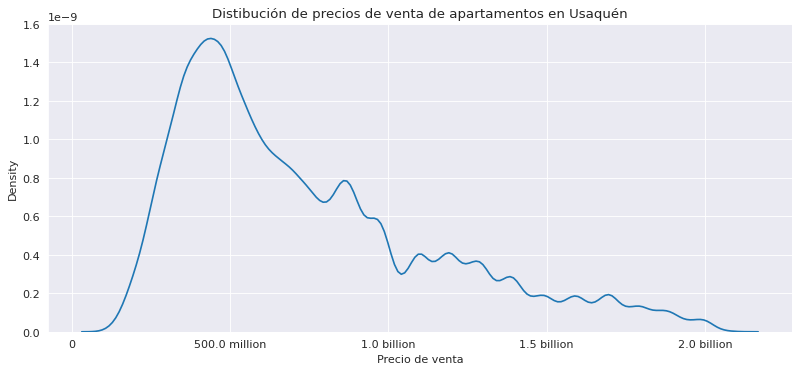

In [34]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='precio_venta',
    bw_adjust=.5,
)

plt.title('Distibución de precios de venta de apartamentos en Usaquén')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Barrios

In [35]:
top_barrios = usaquen.groupby('barrio').agg(
    count=('barrio', 'count'),
    mean=('precio_venta', 'mean'),
    median=('precio_venta', 'median'),
    std=('precio_venta', 'std'),
)

# escoger los que tienen más de 20 registros para que sea más representativo
top_barrios_mean = top_barrios[top_barrios['count'] > 20].sort_values('mean', ascending=False).head(10)
top_barrios_mean.applymap(lambda x: humanize.intword(x))

,count,mean,median,std
barrio,,,,
MONTEARROYO,51,1.6 billion,1.7 billion,223.2 million
BOSQUES DE MEDINA,196,1.6 billion,1.7 billion,274.5 million
SIERRAS DEL MORAL,96,1.6 billion,1.7 billion,364.0 million
RESERVAS DE LA SIERRA - LA ARBOLEDA,78,1.6 billion,1.7 billion,253.1 million
AGUA DULCE,26,1.5 billion,1.8 billion,515.5 million
GINEBRA,91,1.5 billion,1.6 billion,407.4 million
SANTA ANA ORIENTAL,72,1.4 billion,1.5 billion,399.0 million
LOS ALPES II SECTOR,84,1.4 billion,1.4 billion,249.1 million
LA CANADA,67,1.3 billion,1.3 billion,220.2 million


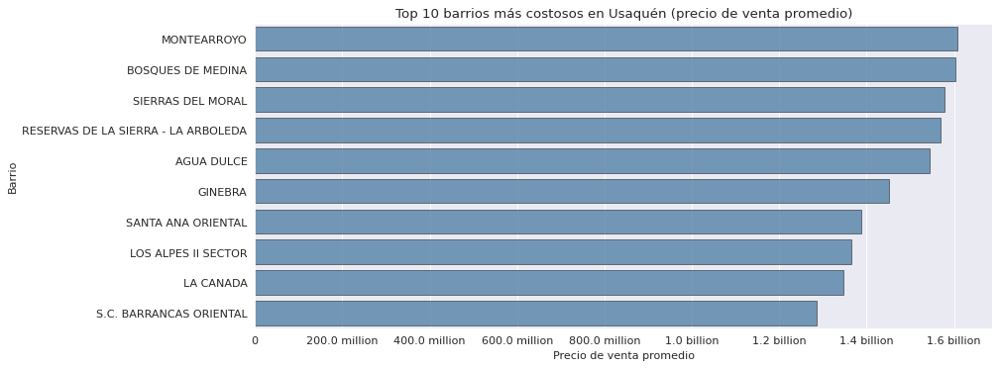

In [36]:
plt.figure(figsize=(12, 5), dpi=80)

sns.barplot(
    top_barrios_mean,
    y=top_barrios_mean.index,
    x='mean',
    color='steelblue',
    # palette='Set1',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Top 10 barrios más costosos en Usaquén (precio de venta promedio)')
plt.xlabel('Precio de venta promedio')
plt.ylabel('Barrio')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))

plt.show()

In [37]:
top_barrios_median = top_barrios[top_barrios['count'] > 20].sort_values('median', ascending=False).head(10)
top_barrios_median.applymap(lambda x: humanize.intword(x))

,count,mean,median,std
barrio,,,,
AGUA DULCE,26,1.5 billion,1.8 billion,515.5 million
SIERRAS DEL MORAL,96,1.6 billion,1.7 billion,364.0 million
RESERVAS DE LA SIERRA - LA ARBOLEDA,78,1.6 billion,1.7 billion,253.1 million
MONTEARROYO,51,1.6 billion,1.7 billion,223.2 million
BOSQUES DE MEDINA,196,1.6 billion,1.7 billion,274.5 million
GINEBRA,91,1.5 billion,1.6 billion,407.4 million
SANTA ANA ORIENTAL,72,1.4 billion,1.5 billion,399.0 million
S.C. BARRANCAS ORIENTAL,23,1.3 billion,1.4 billion,566.1 million
LOS ALPES II SECTOR,84,1.4 billion,1.4 billion,249.1 million


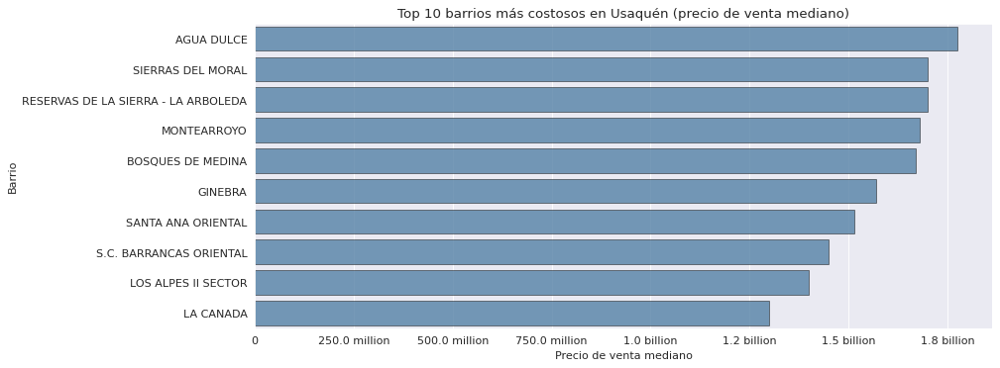

In [38]:
plt.figure(figsize=(12, 5))

sns.barplot(
    top_barrios_median,
    y=top_barrios_median.index,
    x='median',
    color='steelblue',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Top 10 barrios más costosos en Usaquén (precio de venta mediano)')
plt.xlabel('Precio de venta mediano')
plt.ylabel('Barrio')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

In [39]:
top_barrios_economicos = usaquen.groupby('barrio').agg(
    count=('barrio', 'count'),
    mean=('precio_venta', 'mean'),
    median=('precio_venta', 'median'),
    std=('precio_venta', 'std'),
)

top_barrios_economicos_mean = top_barrios_economicos[top_barrios_economicos['count'] > 10].sort_values('mean', ascending=True).head(10)
top_barrios_economicos_mean.applymap(lambda x: humanize.intword(x))

,count,mean,median,std
barrio,,,,
URB. CARRERA 32 186-07,13,152.3 million,148.0 million,14.3 million
HORIZONTES USAQUEN,12,183.0 million,182.0 million,35.6 million
SAN JOSE DE USAQUEN - URB. ARGO,31,194.0 million,190.0 million,27.1 million
TIBABITA II,14,213.5 million,178.5 million,86.5 million
SAN ANTONIO NORTE II SECTOR,16,216.8 million,197.7 million,65.3 million
SAN ANTONIO NORTE,40,235.5 million,244.0 million,45.7 million
TOBERIN,41,243.1 million,230.0 million,88.5 million
LOS NARANJOS,14,247.4 million,232.5 million,44.1 million
LAS ORQUIDEAS,41,252.2 million,250.0 million,48.4 million


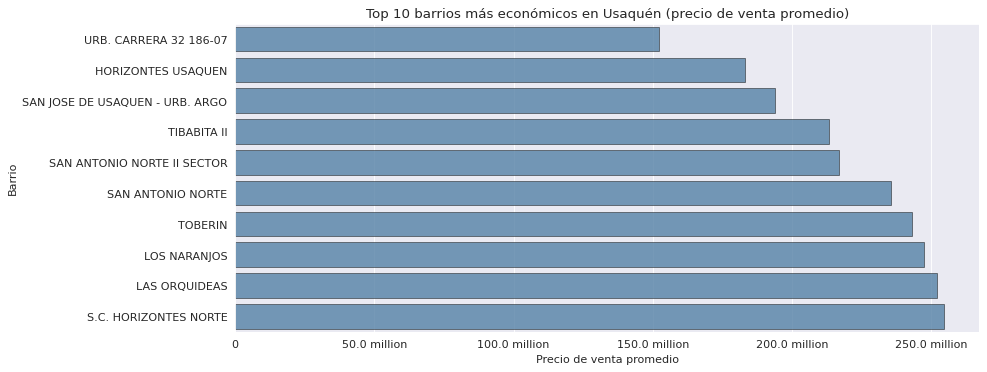

In [40]:
plt.figure(figsize=(12, 5))

sns.barplot(
    top_barrios_economicos_mean,
    y=top_barrios_economicos_mean.index,
    x='mean',
    color='steelblue',
    # palette='Set1',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Top 10 barrios más económicos en Usaquén (precio de venta promedio)')
plt.xlabel('Precio de venta promedio')
plt.ylabel('Barrio')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))

plt.show()

In [41]:
top_barrios_economicos_median = top_barrios_economicos[top_barrios_economicos['count'] > 10].sort_values('median', ascending=True).head(10)
top_barrios_economicos_median.applymap(lambda x: humanize.intword(x))

,count,mean,median,std
barrio,,,,
URB. CARRERA 32 186-07,13,152.3 million,148.0 million,14.3 million
TIBABITA II,14,213.5 million,178.5 million,86.5 million
HORIZONTES USAQUEN,12,183.0 million,182.0 million,35.6 million
SAN JOSE DE USAQUEN - URB. ARGO,31,194.0 million,190.0 million,27.1 million
SAN ANTONIO NORTE II SECTOR,16,216.8 million,197.7 million,65.3 million
LA GRANJA NORTE,60,301.4 million,227.5 million,125.7 million
TOBERIN,41,243.1 million,230.0 million,88.5 million
EL_JARDIN,14,263.3 million,230.0 million,65.5 million
LOS NARANJOS,14,247.4 million,232.5 million,44.1 million


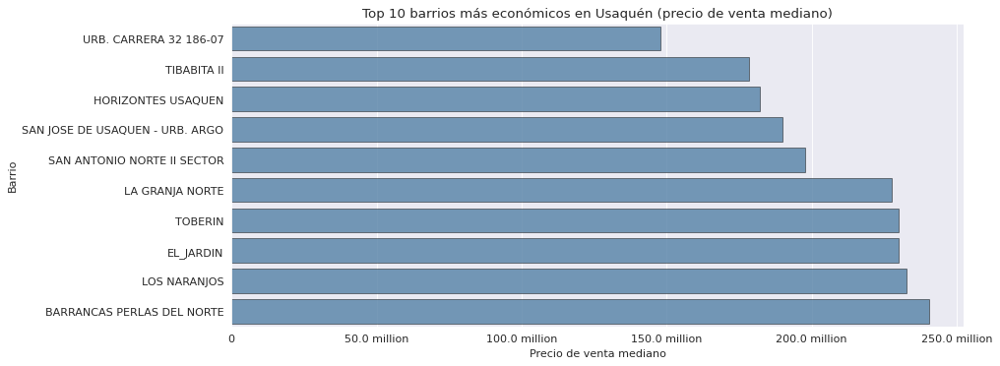

In [42]:
plt.figure(figsize=(12, 5))

sns.barplot(
    top_barrios_economicos_median,
    y=top_barrios_economicos_median.index,
    x='median',
    color='steelblue',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Top 10 barrios más económicos en Usaquén (precio de venta mediano)')
plt.xlabel('Precio de venta mediano')
plt.ylabel('Barrio')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Cercania a Transmilenio

In [43]:
usaquen.groupby('is_cerca_estacion_tm')['precio_venta'].describe().applymap(lambda x: humanize.intcomma(x))

,count,mean,std,min,25%,50%,75%,max
is_cerca_estacion_tm,,,,,,,,
0,"14,312.0","739,756,470.8541783","414,548,373.3021892","120,000,000.0","420,000,000.0","620,000,000.0","954,000,000.0","2,080,000,000.0"
1,"2,344.0","766,302,964.3361775","376,353,235.71417904","183,300,000.0","470,000,000.0","680,000,000.0","960,000,000.0","2,000,000,000.0"


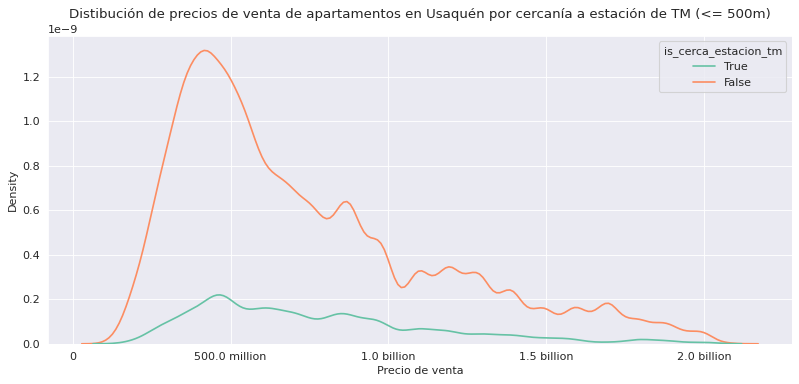

In [44]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='precio_venta',
    bw_adjust=.5,
    hue='is_cerca_estacion_tm',
    hue_order=[True, False],
    palette='Set2',
)

plt.title('Distibución de precios de venta de apartamentos en Usaquén por cercanía a estación de TM (<= 500m)')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

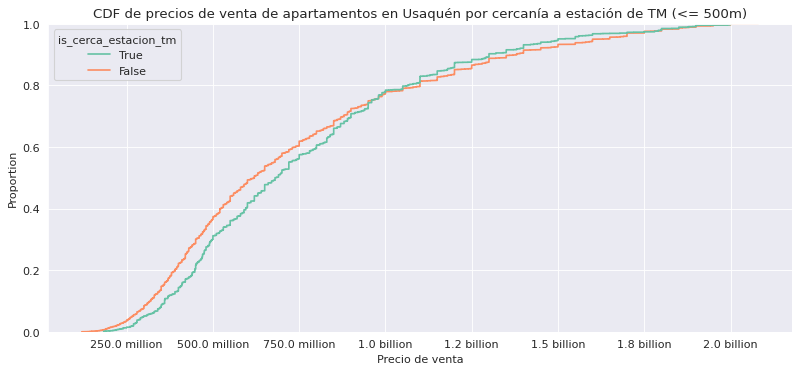

In [45]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='precio_venta',
    hue='is_cerca_estacion_tm',
    hue_order=[True, False],
    palette='Set2',
)

plt.title('CDF de precios de venta de apartamentos en Usaquén por cercanía a estación de TM (<= 500m)')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Estrato

In [46]:
usaquen.groupby('estrato')['precio_venta'].describe().applymap(lambda x: humanize.intword(x))

,count,mean,std,min,25%,50%,75%,max
estrato,,,,,,,,
0.0,8,915.0 million,320.6 million,510.0 million,780.0 million,895.0 million,1.0 billion,1.6 billion
1.0,3,720.5 million,490.9 million,361.6 million,440.8 million,520.0 million,900.0 million,1.3 billion
2.0,37,293.3 million,267.5 million,165.0 million,195.0 million,223.0 million,258.0 million,1.7 billion
3.0,650,279.4 million,161.1 million,120.0 million,200.0 million,250.0 million,295.0 million,1.9 billion
4.0,4.1 thousand,441.9 million,158.1 million,169.9 million,330.0 million,415.0 million,520.0 million,1.7 billion
5.0,4.3 thousand,711.0 million,323.4 million,190.0 million,470.0 million,630.0 million,870.0 million,2.1 billion
6.0,7.6 thousand,966.0 million,418.1 million,188.5 million,630.0 million,890.0 million,1.2 billion,2.1 billion


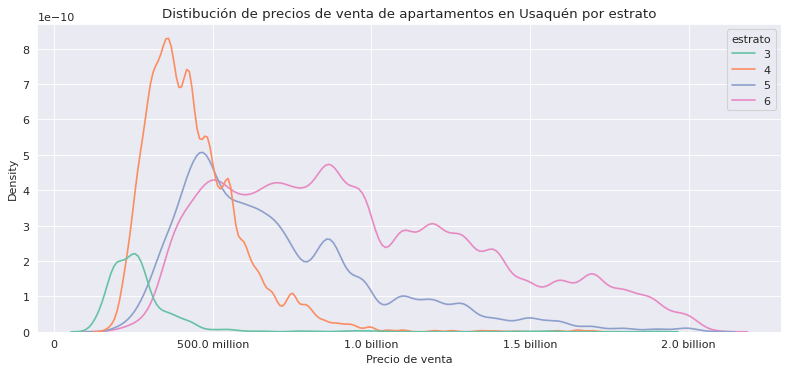

In [47]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='precio_venta',
    bw_adjust=.5,
    hue='estrato',
    hue_order=[3, 4, 5, 6],
    palette='Set2',
)

plt.title('Distibución de precios de venta de apartamentos en Usaquén por estrato')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

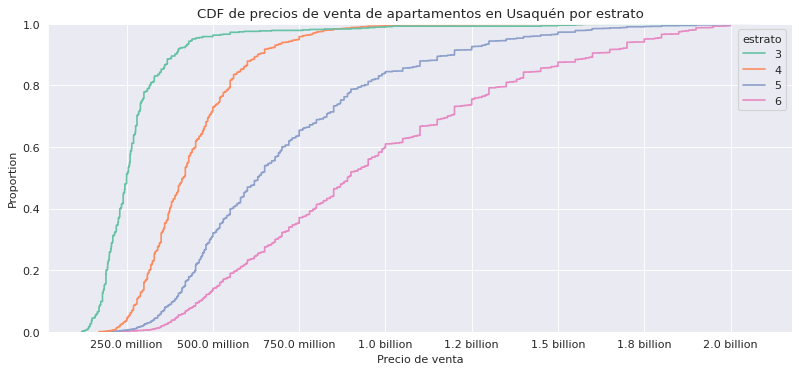

In [48]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='precio_venta',
    hue='estrato',
    hue_order=[3, 4, 5, 6],
    palette='Set2',
)

plt.title('CDF de precios de venta de apartamentos en Usaquén por estrato')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Antiguedad del apartamento

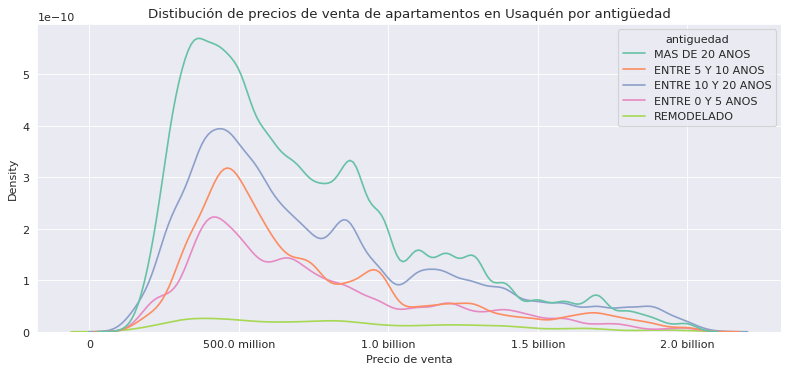

In [49]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen,
    x='precio_venta',
    bw_adjust=.5,
    hue='antiguedad',
    palette='Set2',
)

plt.title('Distibución de precios de venta de apartamentos en Usaquén por antigüedad')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

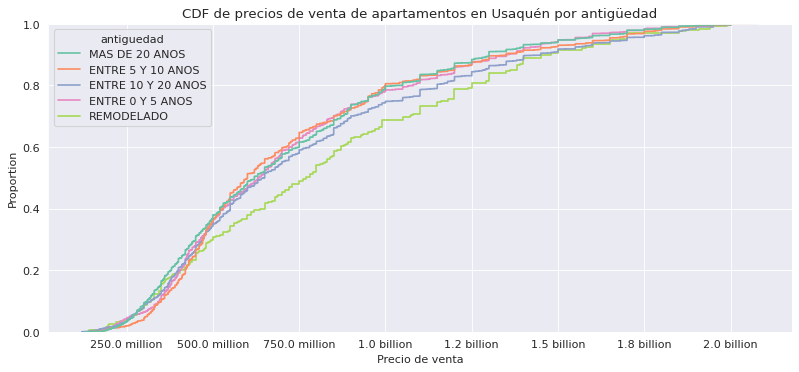

In [50]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen,
    x='precio_venta',
    hue='antiguedad',
    palette='Set2',
)

plt.title('CDF de precios de venta de apartamentos en Usaquén por antigüedad')
plt.xlabel('Precio de venta')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Estacion de TM Cercana

In [51]:
estacion_tm_cercana.groupby('estacion_tm_cercana')['precio_venta'].describe().sort_values('mean', ascending=False).applymap(lambda x: humanize.intword(x))

,count,mean,std,min,25%,50%,75%,max
estacion_tm_cercana,,,,,,,,
Calle 106,598,1.0 billion,395.9 million,310.0 million,720.0 million,950.0 million,1.3 billion,2.0 billion
Calle 100,62,864.1 million,348.4 million,280.0 million,597.5 million,830.0 million,980.0 million,2.0 billion
Pepe Sierra,408,837.6 million,348.7 million,280.0 million,550.0 million,780.0 million,1.0 billion,2.0 billion
Calle 127,385,810.3 million,277.5 million,270.0 million,600.0 million,810.0 million,960.0 million,2.0 billion
Prado,227,734.0 million,356.6 million,183.3 million,451.0 million,610.0 million,950.0 million,2.0 billion
Alcalá,278,539.5 million,181.4 million,265.0 million,420.0 million,488.0 million,640.0 million,1.5 billion
Mazurén,28,525.1 million,107.7 million,275.0 million,472.5 million,600.0 million,600.0 million,605.0 million
Calle 146,74,473.0 million,229.1 million,250.0 million,350.0 million,404.9 million,499.8 million,1.4 billion
Calle 142,165,431.6 million,139.9 million,210.0 million,332.0 million,400.0 million,498.0 million,980.0 million


In [52]:
estacion_tm_cercana_stats_mean = estacion_tm_cercana.groupby('estacion_tm_cercana')['precio_venta'].describe().sort_values('mean', ascending=False)
estacion_tm_cercana_stats_median = estacion_tm_cercana.groupby('estacion_tm_cercana')['precio_venta'].describe().sort_values('50%', ascending=False)

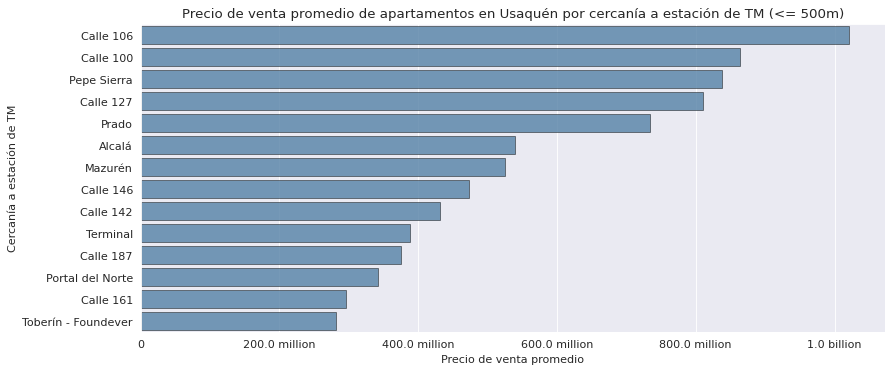

In [53]:
plt.figure(figsize=(12, 5))

sns.barplot(
    estacion_tm_cercana_stats_mean,
    y=estacion_tm_cercana_stats_mean.index,
    x='mean',
    color='steelblue',
    # palette='Set1',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Precio de venta promedio de apartamentos en Usaquén por cercanía a estación de TM (<= 500m)')
plt.xlabel('Precio de venta promedio')
plt.ylabel('Cercanía a estación de TM')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

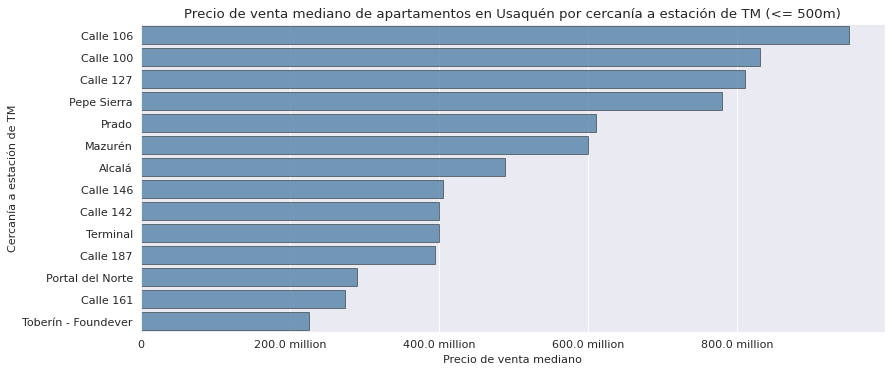

In [54]:
plt.figure(figsize=(12, 5))

sns.barplot(
    estacion_tm_cercana_stats_median,
    y=estacion_tm_cercana_stats_median.index,
    x='50%',
    color='steelblue',
    # palette='Set1',
    edgecolor='black',
    linewidth=.5,
    alpha=.8,
)

plt.title('Precio de venta mediano de apartamentos en Usaquén por cercanía a estación de TM (<= 500m)')
plt.xlabel('Precio de venta mediano')
plt.ylabel('Cercanía a estación de TM')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

<Figure size 960x400 with 0 Axes>

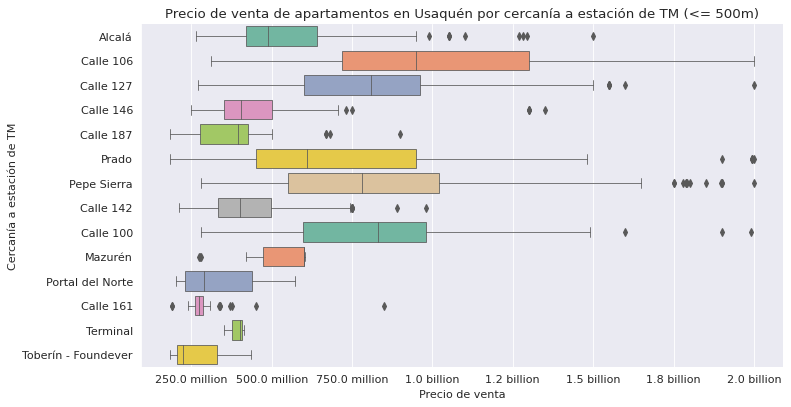

In [55]:
plt.figure(figsize=(12, 5))

sns.catplot(
    data=estacion_tm_cercana,
    x='precio_venta',
    y='estacion_tm_cercana',
    kind='box',
    height=5,
    aspect=2,
    palette='Set2',
    orient='h',
    linewidth=.7,
)

plt.title('Precio de venta de apartamentos en Usaquén por cercanía a estación de TM (<= 500m)')
plt.xlabel('Precio de venta')
plt.ylabel('Cercanía a estación de TM')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.show()

### Precios Anteriores Vs Actuales

In [56]:
#selcionar todos los datos qut no tenga la columna precio_venta_anterior nula
usaquen_ant = usaquen[usaquen['precio_venta_anterior'].notna()]
usaquen_ant = usaquen_ant[usaquen_ant['fecha_actualizacion_precio_venta'].dt.month == 10]
usaquen_ant.shape

(472, 39)

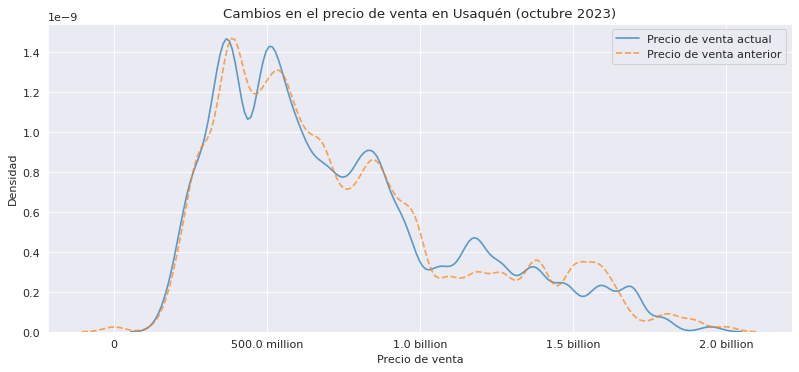

In [57]:
plt.figure(figsize=(12, 5))

sns.kdeplot(
    usaquen_ant,
    x='precio_venta',
    bw_adjust=.3,
    label='Precio de venta actual',
    alpha=.7,
)

sns.kdeplot(
    usaquen_ant,
    x='precio_venta_anterior',
    bw_adjust=.3,
    label='Precio de venta anterior',
    alpha=.7,
    linestyle='--',
)

plt.title('Cambios en el precio de venta en Usaquén (octubre 2023)')
plt.xlabel('Precio de venta')
plt.ylabel('Densidad')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.legend()
plt.show()

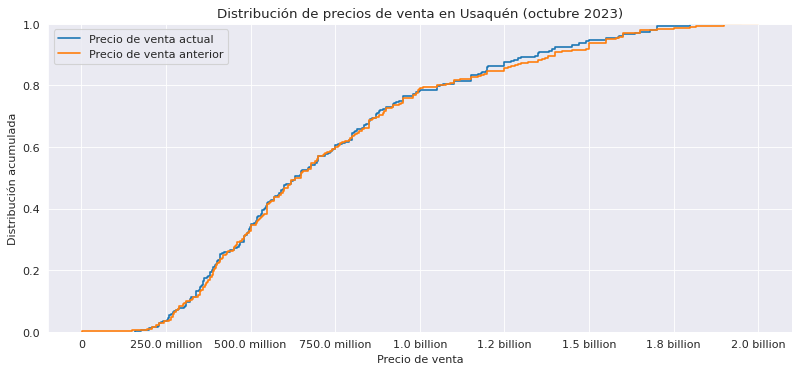

In [58]:
plt.figure(figsize=(12, 5))

sns.ecdfplot(
    usaquen_ant,
    x='precio_venta',
    label='Precio de venta actual',
)

sns.ecdfplot(
    usaquen_ant,
    x='precio_venta_anterior',
    label='Precio de venta anterior',
    # alpha=.7
)

plt.title('Distribución de precios de venta en Usaquén (octubre 2023)')
plt.xlabel('Precio de venta')
plt.ylabel('Distribución acumulada')
plt.gca().get_xaxis().set_major_formatter(plt.FuncFormatter(format_tick_humanize))
plt.legend()
plt.show()

In [59]:
usaquen_ant.precio_venta.describe().apply(lambda x: humanize.intword(x)).to_frame().T

,count,mean,std,min,25%,50%,75%,max
precio_venta,472,734.6 million,390.0 million,159.0 million,410.1 million,630.0 million,942.2 million,1.9 billion


In [60]:
usaquen_ant.precio_venta.describe().apply(lambda x: humanize.intword(x))

count              472
mean     734.6 million
std      390.0 million
min      159.0 million
25%      410.1 million
50%      630.0 million
75%      942.2 million
max        1.9 billion
Name: precio_venta, dtype: object

In [61]:
usaquen_ant.precio_venta_anterior.describe().apply(lambda x: humanize.intword(x)).to_frame().T

,count,mean,std,min,25%,50%,75%,max
precio_venta_anterior,472,744.2 million,402.0 million,1.3 million,425.2 million,650.0 million,950.0 million,2.0 billion


In [62]:
usaquen.precio_venta_anterior.describe().apply(lambda x: humanize.intword(x))

count     1.0 thousand
mean       2.1 billion
std       46.2 billion
min        1.3 million
25%      410.0 million
50%      600.0 million
75%      930.8 million
max       1.5 trillion
Name: precio_venta_anterior, dtype: object

## Antiguedad

In [63]:
usaquen.antiguedad.value_counts()

antiguedad
MAS DE 20 ANOS        6569
ENTRE 10 Y 20 ANOS    4610
ENTRE 5 Y 10 ANOS     2828
ENTRE 0 Y 5 ANOS      2221
REMODELADO             418
Name: count, dtype: int64

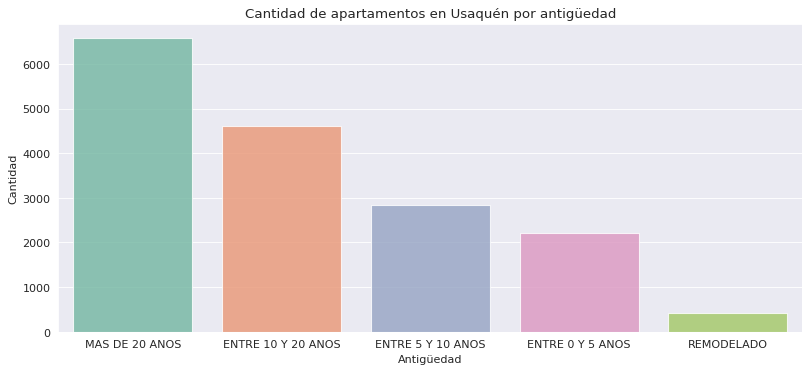

In [65]:
plt.figure(figsize=(12, 5))

sns.countplot(
    usaquen,
    x='antiguedad',
    order=usaquen.antiguedad.value_counts().index,
    palette='Set2',
    # edgecolor='black',
    # linewidth=.5,
    alpha=.8,
)

plt.title('Cantidad de apartamentos en Usaquén por antigüedad')
plt.xlabel('Antigüedad')
plt.ylabel('Cantidad')
plt.show()

### Barrios

In [66]:
usaquen.groupby('antiguedad')['barrio'].describe()

,count,unique,top,freq
antiguedad,,,,
ENTRE 0 Y 5 ANOS,2204,119,SANTA BARBARA OCCIDENTAL,225
ENTRE 10 Y 20 ANOS,4594,153,SANTA BARBARA OCCIDENTAL,372
ENTRE 5 Y 10 ANOS,2810,132,SANTA BARBARA OCCIDENTAL,290
MAS DE 20 ANOS,6502,148,SANTA BARBARA OCCIDENTAL,585
REMODELADO,412,87,SANTA BIBIANA,31


In [67]:
usaquen.groupby('antiguedad')['area'].describe().apply(lambda x: round(x,1))

,count,mean,std,min,25%,50%,75%,max
antiguedad,,,,,,,,
ENTRE 0 Y 5 ANOS,2221.0,93.5,43.0,17.0,60.0,84.0,118.0,275.0
ENTRE 10 Y 20 ANOS,4610.0,121.3,55.0,2.0,78.0,109.0,156.0,280.0
ENTRE 5 Y 10 ANOS,2828.0,105.3,47.5,2.0,71.5,94.0,130.0,280.0
MAS DE 20 ANOS,6569.0,128.9,57.4,1.0,82.0,117.0,170.0,280.0
REMODELADO,418.0,135.1,60.3,29.4,83.2,129.6,179.8,280.0


In [68]:
usaquen.groupby('barrio')['antiguedad'].describe().sort_values(by='count', ascending=False).head(10)

,count,unique,top,freq
barrio,,,,
SANTA BARBARA OCCIDENTAL,1501,5,MAS DE 20 ANOS,585
SAN PATRICIO,1196,5,MAS DE 20 ANOS,419
SANTA BIBIANA,1169,5,MAS DE 20 ANOS,449
SANTA BARBARA CENTRAL I Y II,563,5,ENTRE 10 Y 20 ANOS,165
SANTA BARBARA CENTRAL I SECTOR,541,5,MAS DE 20 ANOS,306
CEDRITOS,523,5,MAS DE 20 ANOS,206
RINCON DEL CHICO,520,5,MAS DE 20 ANOS,275
LA_CAROLINA,515,5,MAS DE 20 ANOS,299
LISBOA_,505,5,ENTRE 10 Y 20 ANOS,255


### Estrato

In [75]:
usaquen.barrio.unique()

array(['SAN PATRICIO', 'GINEBRA', 'URB. SANTACOLOMA', 'CEDRO SALAZAR',
       'VILLAS DEL MEDITERRANEO', 'S.C. LA CAROLINA', 'CEDRITOS',
       'PARQUES DE LORENA', 'EL_VERGEL', 'SANTA BARBARA NORTE',
       'SANTA BIBIANA', 'SANTA BARBARA OCCIDENTAL',
       'SANTA BARBARA CENTRAL I Y II', 'ACACIAS USAQUEN',
       'SANTA BARBARA CENTRAL III SECTOR', 'VILLAS DE ARANJUEZ',
       'LOS CEDROS', 'RINCON DEL CHICO', 'LOS CEDRITOS',
       'SANTA BARBARA CENTRAL I SECTOR', nan,
       'SANTA BARBARA CENTRAL II SECTOR', 'LISBOA_', 'LA EMILIA',
       'COUNTRY CLUB', 'BOSQUES DE MEDINA', 'LOS CAOBOS', 'MOLINOS NORTE',
       'BARRANCAS PERLAS DEL NORTE',
       'RESERVAS DE LA SIERRA - LA ARBOLEDA', 'LOS ALPES II SECTOR',
       'CEDRO NARVAEZ', 'LA_CAROLINA', 'LA CALLEJA', 'EL MORAL',
       'LA CALLEJA SANTACOLOMA', 'MARANTA I Y II Y III SECTOR',
       'LA LIBERIA', 'EL CONTADOR', 'BOSQUE DE PINOS III',
       'URB. FURATENA', 'GINEBRA NORTE', 'CAOBOS SALAZAR',
       'VILLAS DE ANDALUCIA

In [76]:
usaquen.groupby('barrio').agg(
    count=('barrio', 'count'),
    mean=('estrato', 'mean'),
    median=('estrato', 'median'),
    std=('estrato', 'std'),
).sort_values(by='count', ascending=False).head(10)

,count,mean,median,std
barrio,,,,
SANTA BARBARA OCCIDENTAL,1503,5.433422,5.0,0.535758
SAN PATRICIO,1197,5.938179,6.0,0.270366
SANTA BIBIANA,1170,5.941026,6.0,0.242828
SANTA BARBARA CENTRAL I Y II,563,5.889876,6.0,0.402776
SANTA BARBARA CENTRAL I SECTOR,541,5.857671,6.0,0.375255
CEDRITOS,523,4.296367,4.0,0.497240
RINCON DEL CHICO,520,5.628846,6.0,0.604044
LA_CAROLINA,515,5.949515,6.0,0.274349
LISBOA_,505,4.946535,5.0,0.430846


## Barrios

In [78]:
usaquen.groupby('barrio')['codigo'].count().sort_values(ascending=False).to_frame().head(10)

,codigo
barrio,
SANTA BARBARA OCCIDENTAL,1503
SAN PATRICIO,1197
SANTA BIBIANA,1170
SANTA BARBARA CENTRAL I Y II,563
SANTA BARBARA CENTRAL I SECTOR,541
CEDRITOS,523
RINCON DEL CHICO,520
LA_CAROLINA,515
LISBOA_,505


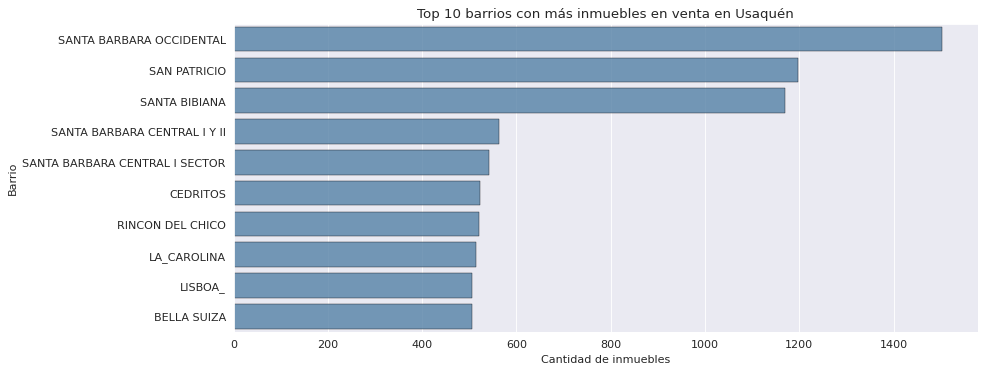

In [79]:
plt.figure(figsize=(12, 5))

sns.barplot(
    data=usaquen.groupby('barrio')['codigo'].count().sort_values(ascending=False).to_frame().head(10),
    x='codigo',
    y=usaquen.groupby('barrio')['codigo'].count().sort_values(ascending=False).to_frame().head(10).index,
    # palette='Set2',
    color='steelblue',
    orient='h',
    edgecolor='black',
    linewidth=.4,
    alpha=.8
)

plt.title('Top 10 barrios con más inmuebles en venta en Usaquén')
plt.xlabel('Cantidad de inmuebles')
plt.ylabel('Barrio')
plt.show()